In [ ]:
# JJ Rolling Pivots

import asyncio
import datetime as dt
import math
from typing import Literal

import matplotlib.pyplot as plt
import mplfinance as mpf
import numpy as np
import pandas as pd
import pandas_market_calendars as mcal
import plotly.graph_objects as go
import polars as pl
from dash import Dash, dcc, html
from plotly.subplots import make_subplots
import pandas_ta as ta

nse = mcal.get_calendar("NSE")

pd.set_option("display.max_rows", 25_000)
pd.set_option("display.max_columns", 500)
pl.Config.set_tbl_cols(500)
pl.Config.set_tbl_rows(10_000)

pd.options.display.float_format = "{:.4f}".format

import sys

sys.path.append("..")
from tooling.enums import AssetClass, Index, Spot, StrikeSpread
from tooling.fetch import fetch_option_data, fetch_spot_data
from tooling.filter import find_atm, option_tool

In [23]:
bnf_1hr = pd.read_csv("../data/bnf_1hr_tv.csv")
bnf_1hr["datetime"] = pd.to_datetime(bnf_1hr["time"])
bnf_1hr = bnf_1hr.drop(columns=["time"])
bnf_1hr = bnf_1hr[
    (bnf_1hr["datetime"].dt.year >= 2017) & (bnf_1hr["datetime"].dt.year <= 2024)
]
bnf_1hr.tail()
bnf_1hr.rename(columns={'open': 'Open', 'high': 'High', 'low': 'Low', 'close': 'Close'}, inplace=True)

In [24]:
df = bnf_1hr
# Calculate Bollinger Bands and RSI using pandas_ta
df.ta.bbands(append=True, length=30, std=2)
df.ta.rsi(append=True, length=14)
df["atr"] = ta.atr(low = df.Low, close = df.Close, high = df.High, length=14)

# Rename columns for clarity if necessary
df.rename(columns={
    'BBL_30_2.0': 'bbl', 'BBM_30_2.0': 'bbm', 'BBU_30_2.0': 'bbh', 'RSI_14': 'rsi'
}, inplace=True)

# Calculate Bollinger Bands Width
df['bb_width'] = (df['bbh'] - df['bbl']) / df['bbm']
df

,Open,High,Low,Close,datetime,bbl,bbm,bbh,BBB_30_2.0,BBP_30_2.0,rsi,atr,bb_width
8590,18234.1500,18249.0000,17995.3500,18017.6000,2017-01-02 09:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8591,18017.1000,18035.7500,17872.1500,17903.9000,2017-01-02 10:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8592,17903.6000,17923.8500,17844.9000,17912.1000,2017-01-02 11:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8593,17911.6000,17951.1500,17893.6500,17946.9000,2017-01-02 12:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8594,17947.1500,18027.8000,17928.1000,18019.3000,2017-01-02 13:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8595,18018.8500,18052.8500,17945.5000,17962.7000,2017-01-02 14:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8596,17963.2500,17983.7500,17957.6000,17977.8000,2017-01-02 15:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8597,17994.2500,18069.6000,17830.9500,18066.6000,2017-01-03 09:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8598,18067.0000,18115.0500,18052.2500,18101.0500,2017-01-03 10:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8599,18100.2000,18106.8500,18044.4500,18079.1500,2017-01-03 11:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
def apply_total_signal(df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold = 0.0015):
    # Initialize the 'TotalSignal' column
    df['TotalSignal'] = 0

    for i in range(1, len(df)):
        # Previous candle conditions
        prev_candle_closes_below_bb = df['Close'].iloc[i-1] < df['bbl'].iloc[i-1]
        prev_rsi_below_thr = df['rsi'].iloc[i-1] < rsi_threshold_low
        # Current candle conditions
        closes_above_prev_high = df['Close'].iloc[i] > df['High'].iloc[i-1]
        bb_width_greater_threshold = df['bb_width'].iloc[i] > bb_width_threshold

        # Combine conditions
        if (prev_candle_closes_below_bb and
            prev_rsi_below_thr and
            closes_above_prev_high and
            bb_width_greater_threshold):
            df.at[i, 'TotalSignal'] = 2  # Set the buy signal for the current candle

        # Previous candle conditions
        prev_candle_closes_above_bb = df['Close'].iloc[i-1] > df['bbh'].iloc[i-1]
        prev_rsi_above_thr = df['rsi'].iloc[i-1] > rsi_threshold_high
        # Current candle conditions
        closes_below_prev_low = df['Close'].iloc[i] < df['Low'].iloc[i-1]
        bb_width_greater_threshold = df['bb_width'].iloc[i] > bb_width_threshold

        # Combine conditions
        if (prev_candle_closes_above_bb and
            prev_rsi_above_thr and
            closes_below_prev_low and
            bb_width_greater_threshold):
            df.at[i, 'TotalSignal'] = 1  # Set the sell signal for the current candle


    return df

apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.001)

,Open,High,Low,Close,datetime,bbl,bbm,bbh,BBB_30_2.0,BBP_30_2.0,rsi,atr,bb_width,TotalSignal
8590,18234.1500,18249.0000,17995.3500,18017.6000,2017-01-02 09:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000
8591,18017.1000,18035.7500,17872.1500,17903.9000,2017-01-02 10:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000
8592,17903.6000,17923.8500,17844.9000,17912.1000,2017-01-02 11:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000
8593,17911.6000,17951.1500,17893.6500,17946.9000,2017-01-02 12:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000
8594,17947.1500,18027.8000,17928.1000,18019.3000,2017-01-02 13:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000
8595,18018.8500,18052.8500,17945.5000,17962.7000,2017-01-02 14:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000
8596,17963.2500,17983.7500,17957.6000,17977.8000,2017-01-02 15:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000
8597,17994.2500,18069.6000,17830.9500,18066.6000,2017-01-03 09:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000
8598,18067.0000,18115.0500,18052.2500,18101.0500,2017-01-03 10:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000
8599,18100.2000,18106.8500,18044.4500,18079.1500,2017-01-03 11:15:00+05:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000


In [26]:
len(df[df.TotalSignal != 0])

119

In [29]:
import numpy as np
def pointpos(x):
    if x['TotalSignal']==2:
        return x['Low']-1e-4
    elif x['TotalSignal']==1:
        return x['High']+1e-4
    else:
        return np.nan

df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)

In [30]:
df.index = df['datetime']

In [31]:
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# from datetime import datetime
# st=0
# # dfpl = df[st:st+350]#.set_index("Gmt time")
# dfpl = df
# # Create a plot with 2 rows
# fig = make_subplots(rows=2, cols=1)

# # Add candlestick plot on the first row
# fig.add_trace(go.Candlestick(x=dfpl.index,
#                              open=dfpl['open'],
#                              high=dfpl['high'],
#                              low=dfpl['low'],
#                              close=dfpl['close']),
#               row=1, col=1)

# # Add Bollinger Bands, EMA lines on the same subplot
# fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['bbl'],
#                          line=dict(color='green', width=1),
#                          name="BBL"),
#               row=1, col=1)
# fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['bbh'],
#                          line=dict(color='green', width=1),
#                          name="BBU"),
#               row=1, col=1)

# # Add markers for trade entry points on the same subplot
# fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['pointpos'], mode="markers",
#                          marker=dict(size=8, color="MediumPurple"),
#                          name="entry"),
#               row=1, col=1)

# # Add markers for trade entry points on the same subplot
# fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['rsi'], 
#                          line=dict(color='green', width=2),
#                          name="BBU"),
#               row=2, col=1)

# fig.update_layout(width=1200, height=800, sliders=[])
# fig.show()

In [32]:
from backtesting import Strategy
from backtesting import Backtest

dfopt = df[0:10000]
def SIGNAL():
    return dfopt.TotalSignal

class MyStrat(Strategy):
    mysize = 0.1
    slcoef = 3
    TPcoef = 2
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)

    def next(self):
        super().next()
        slatr = self.slcoef*self.data.atr[-1]
        tpatr = self.TPcoef*self.data.atr[-1]
    
        if self.signal1==2 and len(self.trades)==0:
            sl1 = self.data.Close[-1] - slatr
            tp1 = self.data.Close[-1] + tpatr
            self.buy(sl=sl1, tp=tp1, size=self.mysize)

        if self.signal1==1 and len(self.trades)==0:
            sl1 = self.data.Close[-1] + slatr
            tp1 = self.data.Close[-1] - tpatr
            self.sell(sl=sl1, tp=tp1, size=self.mysize)
        
bt = Backtest(dfopt, MyStrat, cash=10000, margin=1/10, commission=0.001) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(10, 16)],
                    TPcoef=[i/10 for i in range(10, 21)],
                    maximize='Return [%]', max_tries=300,
                        random_state=0,
                        return_heatmap=True)
stats

/tmp/ipykernel_2910/1785803022.py:32: UserWarning: Some prices are larger than initial cash value. Note that fractional trading is not supported. If you want to trade Bitcoin, increase initial cash, or trade μBTC or satoshis instead (GH-134).
  bt = Backtest(dfopt, MyStrat, cash=10000, margin=1/10, commission=0.001) #0.0002
/home/jagjot/strategies/droplets/.venv/lib/python3.11/site-packages/backtesting/backtesting.py:1384: FutureWarning: The behavior of Series.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  best_params = heatmap.idxmax()


Start                     2017-01-02 09:15...
End                       2022-10-14 11:15...
Duration                   2111 days 02:00:00
Exposure Time [%]                      0.0000
Equity Final [$]                   10000.0000
Equity Peak [$]                    10000.0000
Return [%]                             0.0000
Buy & Hold Return [%]                119.1835
Return (Ann.) [%]                      0.0000
Volatility (Ann.) [%]                  0.0000
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              NaN
Max. Drawdown [%]                     -0.0000
Avg. Drawdown [%]                         NaN
Max. Drawdown Duration                    NaN
Avg. Drawdown Duration                    NaN
# Trades                                    0
Win Rate [%]                              NaN
Best Trade [%]                            NaN
Worst Trade [%]                           NaN
Avg. Trade [%]                    

In [9]:
stats["_strategy"]

<Strategy MyStrat(slcoef=1.5,TPcoef=2.0)>

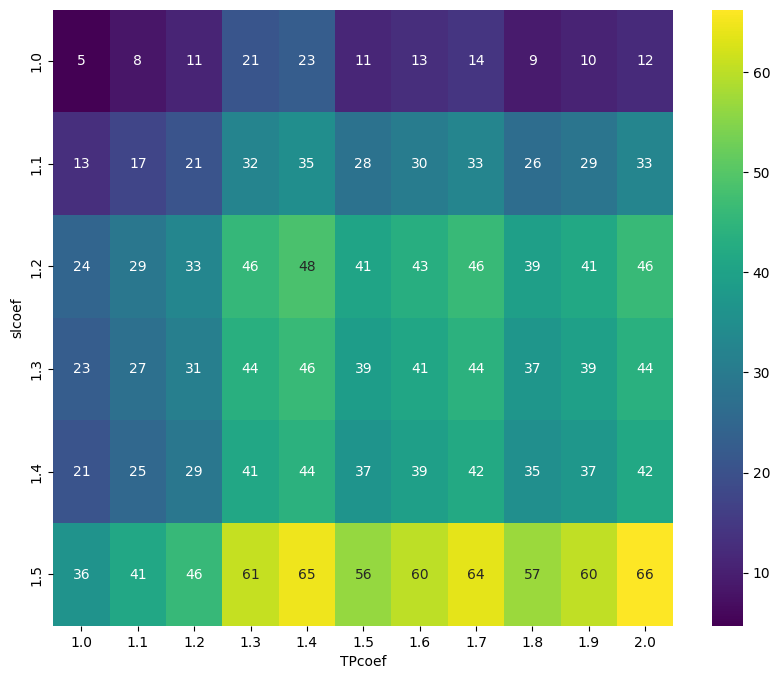

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.0f')
plt.show()

In [24]:
bt.plot()

f:\Python\Lib\site-packages\backtesting\_plotting.py:659: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

f:\Python\Lib\site-packages\backtesting\_plotting.py:659: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



GridPlot(id='p1307', ...)